# Aprendizaje Profundo para Procesamiento deSeñales de Imagen y Vídeo (APPIV)
## Master in Data Science / Máster en Ciencia de Datos
## Universidad Autonoma de Madrid

## **P2: multiple object tracking for video sequences (template for assignment)**

This task for the assignment "práctica 2" is to **goal is to analyze and improve the tracking performance of the baseline multi-object tracker provided in the tutorial**. Your submission consists on a report in PDF formant and this notebook (plus any additional source code files needed). You can *cut&paste as needed from the tutorial notebook* but please identify clearly your contributions with respect to the tutorial.

Your submission should adhere to the following restrictions (see the tutorial for further info on each aspect):
* The tracker must be based on the tracking-by-detection scheme, so an object detector must be applied.
* For evaluation, you must use the [MOT16](https://motchallenge.net/data/MOT16/) dataset. In particular, you must use the train/test partition provided in the [material](http://www-vpu.eps.uam.es/~jcs/APPIV/appiv_p2_material.zip) based on the original `MOT16-train`(the only one that has ground-truth available).
* The evaluation should be quantitative employing well-known metrics such as MOTA, MOTP, TP, FP, FN and IDswitches.


Author1: Pablo Aguilera Onieva (pablo.aguilerao@estudiante.uam.es)


# 1 Setup
Add here all the required setup and libraries to run your tracker...

In [ ]:
!pip uninstall -y pandas
!pip3 install pandas==1.3.3

Found existing installation: pandas 1.3.3
Uninstalling pandas-1.3.3:
  Successfully uninstalled pandas-1.3.3
Defaulting to user installation because normal site-packages is not writeable
  Using cached pandas-1.3.3-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (11.5 MB)


In [ ]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

!pip3 install tqdm lap

# !pip3 install torch==2.1.0+cu121 torchvision==0.16.0+cu121 torchaudio===2.1.0+cu121 --extra-index-url https://download.pytorch.org/whl/cu121 #Pytorch and requirements
# #!pip3 uninstall http://www-vpu.eps.uam.es/~jcs/DLVSP/py-motmetrics-fix_pandas_deprecating_warnings.zip # #Evaluation metrics for MOT (python < 3.8)
# !pip3 install http://www-vpu.eps.uam.es/~jcs/DLVSP/py-motmetrics-fix_pandas_deprecating_warnings_python310.zip # #Evaluation metrics for MOT (python >= 3.8)

Defaulting to user installation because normal site-packages is not writeable


In [ ]:
import torch, torchvision, torchaudio
print(torch.__version__)
print(torchvision.__version__)
print(torchaudio.__version__)

2.3.0+cu121
0.18.0+cu121
2.3.0+cu121


Verificamos que estén disponibles los recursos de GPU.

In [ ]:
if not torch.cuda.is_available():
    raise ValueError("No GPU resources available.")

## 1.2 Connect to Google Drive

In [ ]:
# # Connet to Google Drive
# from google.colab import drive
# drive.mount('/content/gdrive', force_remount=True)

## 1.3 Download material for the assignment

In [ ]:
# import os, subprocess

# # path to download in Google Drive
# download_dir = '/content/gdrive/My Drive/downloads/'

# # file with the material for the assignment
# urlfile = 'http://www-vpu.eps.uam.es/~jcs/APPSIV/appsiv_p2_material.zip'
# datafile = os.path.basename(urlfile) #with extension

# # Download material if not available in download directory
# datadownload_path = os.path.join(download_dir,datafile)
# if os.path.isfile(datadownload_path) == False:
#   !curl $urlfile --create-dirs -o "$datadownload_path"
#   print('The file \'{}\' has been downloaded to directory \'{}\''.format(datafile,download_dir))
# else:
#   print('The file \'{}\' is already available in the directory \'{}\''.format(datafile,download_dir))

## 1.4 Copy material to local directory

In [ ]:
# import os, subprocess, zipfile
# from tqdm.autonotebook import tqdm

# # path to working directory (local, will be deleted when VM disconnected)
# working_dir = '/content/work/'

# # copy downloaded file to the working directory
# print('Copying file \'{}\' from \'{}\' to \'{}\'...'.format(datafile,download_dir,working_dir))
# if os.path.isfile(os.path.join(working_dir,datafile)) == False:
#   !rsync -ah --progress "$datadownload_path" "$working_dir"
# else:
#   print('already exists!')

# # uncompress/unzip file in the working directory
# print('\nUnzipping file \'{}\' in directory \'{}\'...'.format(datafile, working_dir), end='')
# if os.path.isdir(os.path.join(working_dir,'data')) == False:
#   with zipfile.ZipFile(os.path.join(working_dir,datafile)) as zf:
#     for member in tqdm(zf.infolist(), desc='Extracting '):
#         try:
#           zf.extract(member, working_dir)
#         except zipfile.error as e:
#             pass
# else:
#   print('already unzipped!')

## 1.5 Add source code location to system path

In [ ]:
!pip3 install motmetrics opencv-python

Defaulting to user installation because normal site-packages is not writeable


In [ ]:
working_dir = 'work/'

In [ ]:
import sys,os

# add the path to the system so we can import the tracker
sys.path.append(os.path.join(working_dir,'src/'))

# test that we can successfully import the tracker
from tracker.tracker import Tracker
print('If \'from tracker.tracker import Tracker\' shows no errors, you can import and execute the sample tracker code.\n')
print('Source files of the tracker are available at the directory \'{}\':'.format(working_dir+'src/tracker/'))
!ls $working_dir/src/tracker

print('object_detector.py --> defines the object detector to be employed for tracking (FRCNN_FPN)')
print('tracker.py         --> defines the architecture for developing trackers (i.e. common functions)')
print('data_obj_detect.py --> utility for handing datasets/sequences for object detection')
print('data_track.py      --> utility for handing datasets/sequences for object tracking')
print('utils.py           --> Utilities for evaluation and plotting')

If 'from tracker.tracker import Tracker' shows no errors, you can import and execute the sample tracker code.

Source files of the tracker are available at the directory 'work/src/tracker/':
__init__.py  data_obj_detect.py  object_detector.py  utils.py
__pycache__  data_track.py	 tracker.py
object_detector.py --> defines the object detector to be employed for tracking (FRCNN_FPN)
tracker.py         --> defines the architecture for developing trackers (i.e. common functions)
data_obj_detect.py --> utility for handing datasets/sequences for object detection
data_track.py      --> utility for handing datasets/sequences for object tracking
utils.py           --> Utilities for evaluation and plotting


# 2 Dataset

Add here all the required code to load the dataset...


## 2.1 Train/test split

In [ ]:
#list the contents of the 'train' directory
train_dir = os.path.join(working_dir,'data/MOT16/train')
print('Train directory:')
!ls $train_dir

#list the contents of the 'test' directory
test_dir = os.path.join(working_dir,'data/MOT16/test')
print('Test directory:')
!ls $test_dir

Train directory:
MOT16-02  MOT16-04  MOT16-05  MOT16-09
Test directory:
MOT16-10  MOT16-11  MOT16-13


## 2.2 Visualization


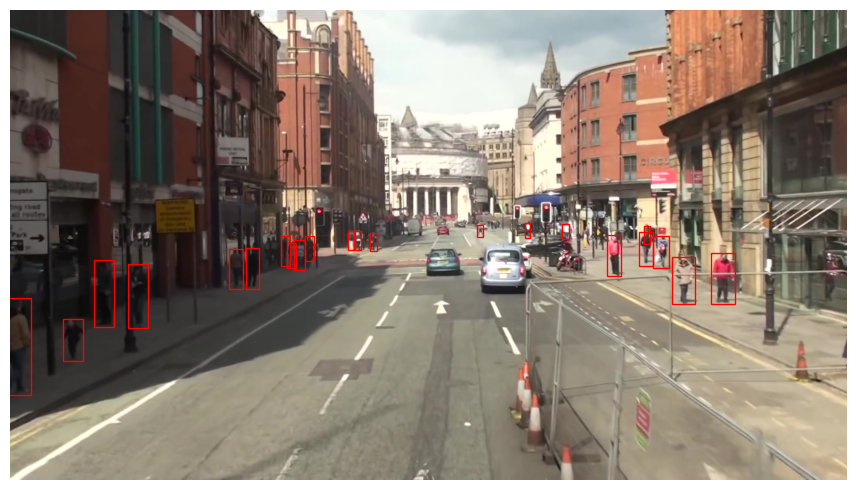

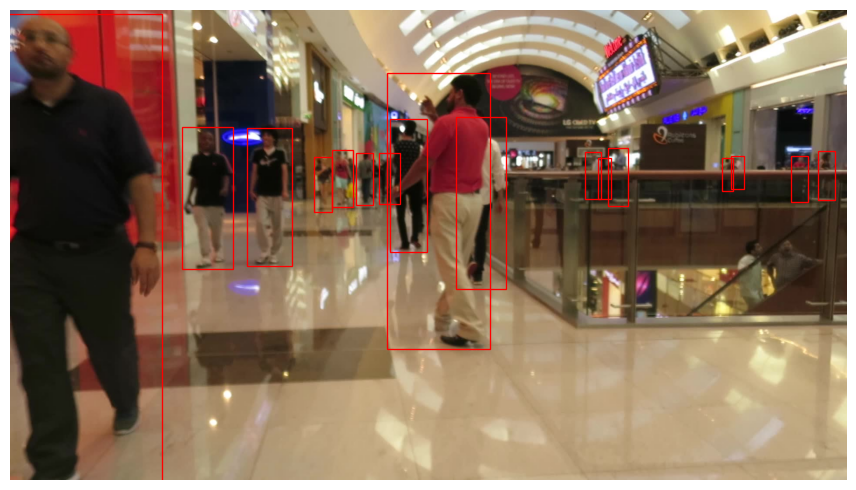

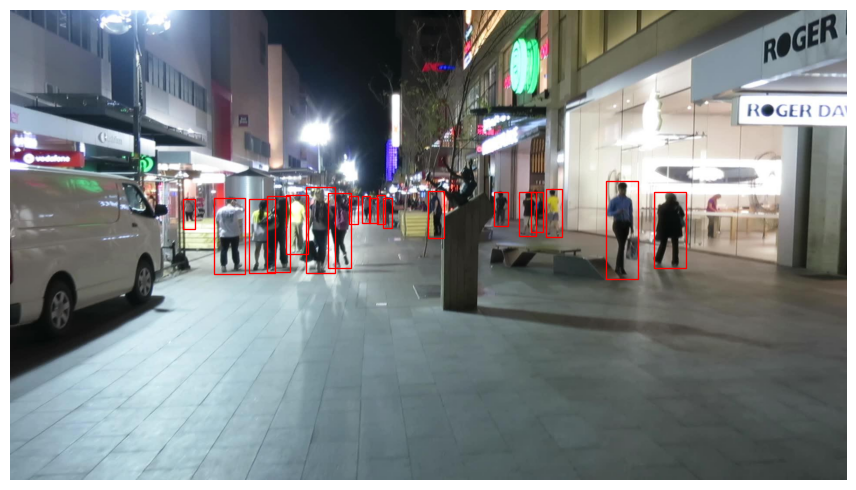

In [ ]:
import matplotlib.pyplot as plt
from tracker.data_track import MOT16Sequences

seq_name = 'MOT16-02'
#seq_name = 'MOT16-train'
seq_name = 'MOT16-test'
data_dir = os.path.join(working_dir,'data/MOT16')
sequences = MOT16Sequences(seq_name, data_dir, load_seg=True)

for seq in sequences:
    for i, frame in enumerate(seq):
        img = frame['img']

        dpi = 96
        fig, ax = plt.subplots(1, dpi=dpi)

        img = img.mul(255).permute(1, 2, 0).byte().numpy()
        width, height, _ = img.shape

        ax.imshow(img, cmap='gray')
        fig.set_size_inches(width / dpi, height / dpi)

        if 'gt' in frame:
            gt = frame['gt']
            for gt_id, box in gt.items():
                rect = plt.Rectangle(
                  (box[0], box[1]), box[2] - box[0],box[3] - box[1],
                  fill=False,
                  edgecolor="red",
                  linewidth=1.0)
                ax.add_patch(rect)

        plt.axis('off')
        plt.show()

        break #we only plot the first image for each sequence

# 3 Object detector
Add here all the required code to load the detector employed by the tracker...


## 3.1 Model


In [ ]:
# path for the source code of the tracker
model_dir=working_dir+'models/'

print('Model files of the tracker are available at the directory \'{}\':'.format(model_dir))
!ls "$model_dir"

Model files of the tracker are available at the directory 'work/models/':
faster_rcnn_fpn.model


## 3.2 Configuration

In [ ]:
import torch

#select GPU if available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

#location of the model file
obj_detect_model_file = os.path.join(working_dir, "models/faster_rcnn_fpn.model")

#threshold for non maximum suppression
obj_detect_nms_thresh = 0.3
obj_detect_score_thresh = 0.7

#detector has been trained for two classes
num_classes=2 # 1 class (person) + background (see https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html)

## 3.3 Creation of the object detector

In [ ]:
from tracker.object_detector import FRCNN_FPN

# object detector
obj_detect = FRCNN_FPN(num_classes=num_classes, nms_thresh=obj_detect_nms_thresh)
obj_detect_state_dict = torch.load(obj_detect_model_file,map_location=lambda storage, loc: storage)
obj_detect.load_state_dict(obj_detect_state_dict)

# prints the architecture and sets the model to evaluation mode.
obj_detect.eval()

# loads detector to CPU or GPU (if available)
obj_detect.to(device)

/home/fernando/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:135: UserWarning: Using 'backbone_name' and 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/home/fernando/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


FRCNN_FPN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu)

## 3.4 Evaluate the object detector

In [ ]:
# !pip3 uninstall -y numpy tqdm lap pandas
# !pip3 install numpy==1.25.2 tqdm==4.66.4 lap==0.4.0 pandas==2.2.2

In [ ]:
%%time

from tracker.data_obj_detect import MOT16ObjDetect
from tracker.utils import (evaluate_obj_detect, obj_detect_transforms)

#load train set for the MOT16 data (images and ground-truth bounding boxes)
dataset_test = MOT16ObjDetect(os.path.join(working_dir, 'data/MOT16/train'), obj_detect_transforms(train=False))

def collate_fn(batch):
    return tuple(zip(*batch))
data_loader_test = torch.utils.data.DataLoader(dataset_test, batch_size=1, shuffle=False, num_workers=2,collate_fn=collate_fn)

#evaluation
evaluate_obj_detect(obj_detect, data_loader_test)

  0%|                                                                                          | 0/3012 [00:00<?, ?it/s]/home/fernando/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
100%|███████████████████████████████████████████████████████████████████████████████| 3012/3012 [03:58<00:00, 12.63it/s]


AP: 84.7773 %.  Prec: 94.5962 %.  Rec: 89.6079 %.  TP: 51676.  FP: 2952.  F1-score: 92.0345 %.
CPU times: user 4min 51s, sys: 15.9 s, total: 5min 7s
Wall time: 5min 8s


# 4 Multi-object tracking
Add here all the required code to load and run your tracker...

## 4.1 Configuration

In [ ]:
import torch
from tracker.object_detector import FRCNN_FPN

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# object detector
obj_detect = FRCNN_FPN(num_classes=num_classes, nms_thresh=obj_detect_nms_thresh)
obj_detect_state_dict = torch.load(obj_detect_model_file,map_location=lambda storage, loc: storage)
obj_detect.load_state_dict(obj_detect_state_dict)
obj_detect.eval()     # set to evaluation mode
obj_detect.to(device) # load detector to GPU or CPU

# select dataset
seq_name = 'MOT16-test' #'MOT16-train', 'MOT16-02'
data_dir = os.path.join(working_dir, 'data/MOT16')
sequences = MOT16Sequences(seq_name, data_dir)
print('Loaded {:d} sequences for {:s}'.format(len(sequences),seq_name))

#output directory
output_dir = os.path.join(working_dir, 'output')

/home/fernando/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:135: UserWarning: Using 'backbone_name' and 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/home/fernando/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Loaded 3 sequences for MOT16-test


In [ ]:
import torch
import numpy as np

seed = 12345 #seed to allow repeatable results
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
torch.backends.cudnn.deterministic = True

## 4.2 Extend the baseline tracker


In [ ]:
import numpy as np
import motmetrics as mm
mm.lap.default_solver = 'lap'
from tracker.tracker import Tracker

# extended class 'Tracker' based on IoU criterion
class TrackerIoUAssignment(Tracker):

    def data_association(self, boxes, scores):
        if self.tracks:
            track_ids = [t.id for t in self.tracks]
            track_boxes = np.stack([t.box.numpy() for t in self.tracks], axis=0)

            # compute distance based on IoU (distance=1-IoU)
            distance = mm.distances.iou_matrix(track_boxes, boxes.numpy(), max_iou=0.5)

            # update existing tracks
            remove_track_ids = []
            for t, dist in zip(self.tracks, distance):
                if np.isnan(dist).all():
                    remove_track_ids.append(t.id)
                else:
                    match_id = np.nanargmin(dist)
                    t.box = boxes[match_id]
            self.tracks = [t for t in self.tracks
                           if t.id not in remove_track_ids]

            # add new tracks
            new_boxes = []
            new_scores = []
            for i, dist in enumerate(np.transpose(distance)):
                if np.isnan(dist).all():
                    new_boxes.append(boxes[i])
                    new_scores.append(scores[i])
            self.add(new_boxes, new_scores)

        else:
            self.add(boxes, scores)

# create a new tracker using the 'TrackerIoUAssignment' class
tracker = TrackerIoUAssignment(obj_detect)
print('Tracker created!')

Tracker created!


## 4.3 Run tracker

In [ ]:
import time
from tqdm import tqdm
from tracker.utils import get_mot_accum

time_total = 0
mot_accums = []
results_seq = {}

for seq in sequences:
    print(f"Tracking: {seq}")
    now = time.time()

    # restart tracker state for each sequence
    tracker.reset()

    #load data
    data_loader = torch.utils.data.DataLoader(seq, batch_size=1, shuffle=False)

    #run tracker
    for frame in tqdm(data_loader):
        tracker.step(frame)

    #keep results
    results = tracker.get_results()
    results_seq[str(seq)] = results

    #perform evaluation
    if seq.no_gt:
        print(f"No GT evaluation data available.")
    else:
        mot_accums.append(get_mot_accum(results, seq)) #compute and store eval metrics

    time_total += time.time() - now

    print(f"Tracks found: {len(results)}")
    print(f"Runtime for {seq}: {time.time() - now:.1f} s.")

    #save results to output directory
    seq.write_results(results, os.path.join(output_dir))

Tracking: MOT16-13


100%|█████████████████████████████████████████████████████████████████████████████████| 750/750 [01:14<00:00, 10.09it/s]


Tracks found: 111
Runtime for MOT16-13: 85.4 s.
Writing predictions to: work/output/MOT16-13.txt
Tracking: MOT16-11


100%|█████████████████████████████████████████████████████████████████████████████████| 900/900 [01:28<00:00, 10.11it/s]


Tracks found: 63
Runtime for MOT16-11: 101.4 s.
Writing predictions to: work/output/MOT16-11.txt
Tracking: MOT16-10


100%|█████████████████████████████████████████████████████████████████████████████████| 654/654 [01:05<00:00, 10.03it/s]


Tracks found: 87
Runtime for MOT16-10: 75.2 s.
Writing predictions to: work/output/MOT16-10.txt


## 4.4 Evaluate tracking results

In [ ]:
from tracker.utils import evaluate_mot_accums

print(f"Runtime for all sequences: {time_total:.1f} s.")
if mot_accums:
    evaluate_mot_accums(mot_accums,
                        [str(s) for s in sequences if not s.no_gt],
                        generate_overall=True)

Runtime for all sequences: 262.0 s.
          IDF1   IDP   IDR  Rcll  Prcn  GT MT PT ML   FP    FN IDs   FM  MOTA  MOTP
MOT16-13 46.5% 64.2% 36.5% 45.1% 79.2% 110 28 34 48 1375  6393  82  124 32.6% 0.134
MOT16-11 49.0% 54.1% 44.8% 55.8% 67.5%  75 15 32 28 2542  4166  20   39 28.7% 0.080
MOT16-10 35.3% 40.6% 31.3% 42.0% 54.5%  57 13 23 21 4504  7449  69  120  6.4% 0.138
OVERALL  42.9% 51.3% 36.8% 46.9% 65.4% 242 56 89 97 8421 18008 171  283 21.6% 0.118


As a reference, the current state-of-the-art multi-object tracker [Tracktor++](https://arxiv.org/abs/1903.05625) achieves the following tracking results on the full `MOT16-train` sequences:

              IDF1   IDP   IDR  Rcll  Prcn  GT  MT  PT  ML  FP    FN IDs   FM  MOTA  MOTP
    MOT16-02 45.8% 78.3% 32.4% 41.3% 99.8%  62   9  32  21  18 10909  59   68 40.9% 0.080
    MOT16-04 71.1% 90.3% 58.6% 64.7% 99.8%  83  32  29  22  71 16785  22   29 64.5% 0.096
    MOT16-05 64.0% 86.6% 50.7% 57.5% 98.1% 133  32  65  36  75  2942  37   59 55.8% 0.144
    MOT16-09 54.6% 69.4% 45.0% 64.3% 99.1%  26  11  13   2  31  1903  22   31 63.3% 0.086
    MOT16-10 64.3% 75.7% 55.9% 72.4% 98.0%  57  28  26   3 189  3543  71  125 70.4% 0.148
    MOT16-11 63.3% 77.0% 53.7% 69.0% 98.9%  75  24  33  18  73  2924  26   26 68.0% 0.081
    MOT16-13 73.6% 85.1% 64.8% 74.2% 97.6% 110  60  39  11 213  3000  62   90 71.9% 0.132
    OVERALL  65.0% 84.0% 53.1% 62.6% 99.1% 546 196 237 113 670 42006 299  428 61.7% 0.106

Note that the `MOT16-train` set is different from the sets of this assignment:  `train` (first four sequences of `MOT16-train`) and `test` (last three sequences of `MOT16-train`).

For your final submission you should focus on improving `MOTA` for the `train` and `test` sets provided as material of this assignment.

## 4.5 Visualize tracking results


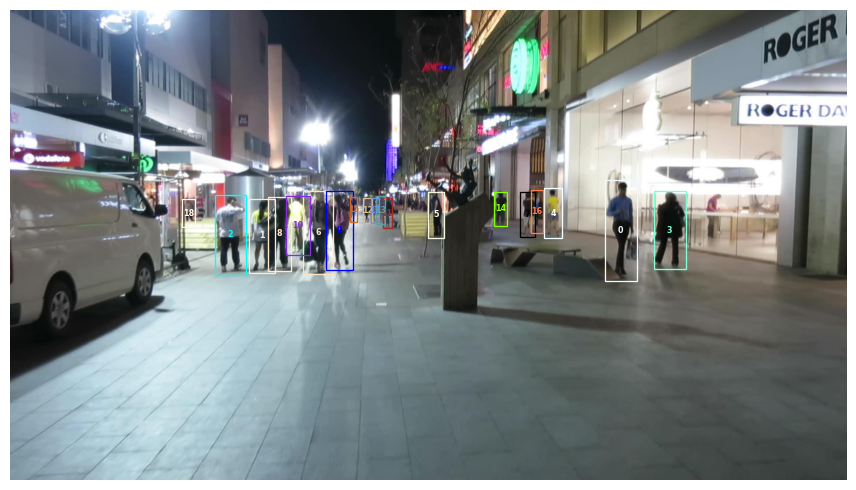

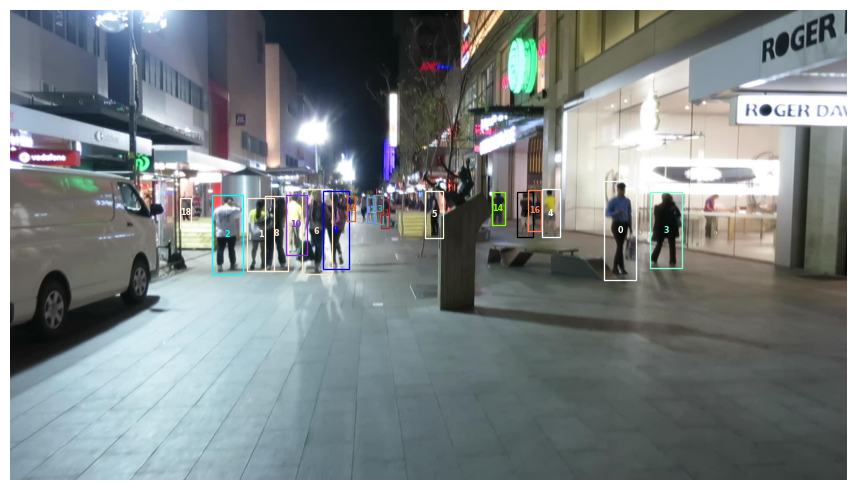

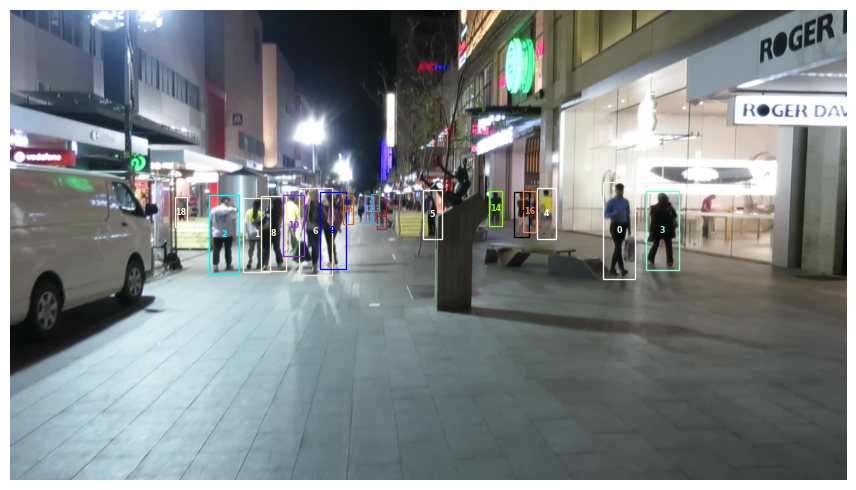

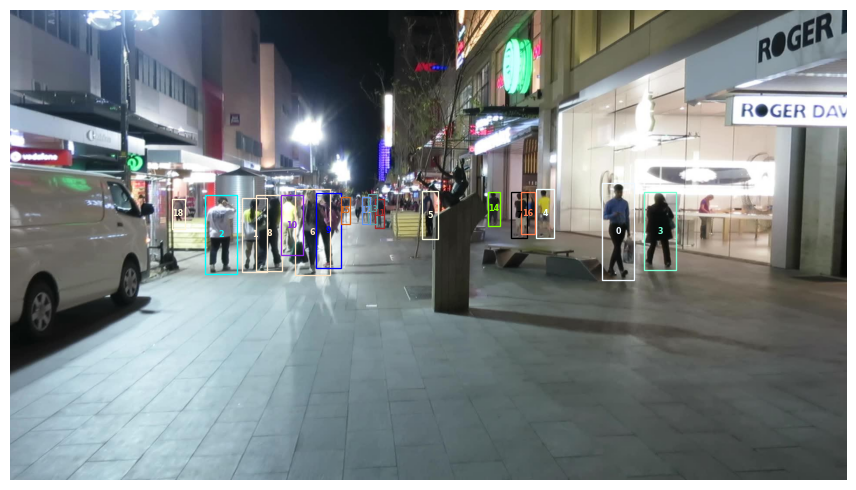

In [ ]:
import matplotlib.pyplot as plt
from tracker.utils import plot_sequence

plot_sequence(results_seq['MOT16-10'],
              [s for s in sequences if str(s) == 'MOT16-10'][0],
              first_n_frames=3)

## 4.6 Copy results to Google Drive
The `seq.write_results(results, os.path.join(output_dir))` statement saves predicted tracks into files. After executing this cell the `output` directory in your Google Drive should contain multiple `MOT16-XY.txt` files.

Here we will copy these results in the `download_dir` directory of your Google Drive account.

In [ ]:
# #copy output files to download directory in personal Google Drive
# !cp -r $output_dir "$download_dir"

# #show output files
# print('Output tracking results:')
# path = os.path.join(download_dir,"output")
# !ls "$path"

# 5. Extend the baseline object detector

Vamos a tratar de mejorar el detector de objetos considerando únicamente detecciones de alta calidad.

Para ello, debemos investigar en detalle los atributos de la clase `torchvision.models.detection.FasterRCNN`. En la documentación (https://pytorch.org/vision/main/_modules/torchvision/models/detection/faster_rcnn.html) encontramos la siguiente información sobre sus parámetros:

- `box_nms_thresh` (float): NMS threshold for the prediction head. Used during inference.

- `rpn_nms_thresh` (float): NMS threshold used for postprocessing the RPN proposals.

- `box_score_thresh` (float): during inference, only return proposals with a classification score greater than box_score_thresh.

- `rpn_score_thresh` (float): only return proposals with an objectness score greater than rpn_score_thresh.

Aclarar que `rpn` se refiere a *red de propuestas de región*, que es el componente del modelo de detección de objetos que genera regiones candidatas (propuestas) donde podrían estar los objetos. Además, `nms` se refiere a la *supresión de no-máximos*, que es la técnica utilizada para eliminar propuestas redundantes que se solapan significativamente, manteniendo solo las más relevantes. Así, el parámetro `box_nms_thresh` define el umbral de NMS aplicado a las predicciones finales durante la inferencia, para eliminar cuadros delimitadores redundantes. `rpn_nms_thresh` es el umbral de NMS utilizado para filtrar las propuestas generadas por la RPN. `box_score_thresh` establece un umbral mínimo de puntuación de clasificación para que las propuestas se consideren durante la inferencia, descartando aquellas con puntuaciones más bajas. Por último, `rpn_score_thresh` define un umbral mínimo para la puntuación de objetividad de las propuestas de la RPN, filtrando las menos probables antes del procesamiento posterior.

Así, podemos modificar todos estos parámetros para que el algoritmo sea más o menos restrictivo a la hora de detectar a las personas.

In [ ]:
import inspect
import torchvision
source_code = inspect.getsource(torchvision.models.detection.FasterRCNN)
print(source_code)

class FasterRCNN(GeneralizedRCNN):
    """
    Implements Faster R-CNN.

    The input to the model is expected to be a list of tensors, each of shape [C, H, W], one for each
    image, and should be in 0-1 range. Different images can have different sizes.

    The behavior of the model changes depending on if it is in training or evaluation mode.

    During training, the model expects both the input tensors and targets (list of dictionary),
    containing:
        - boxes (``FloatTensor[N, 4]``): the ground-truth boxes in ``[x1, y1, x2, y2]`` format, with
          ``0 <= x1 < x2 <= W`` and ``0 <= y1 < y2 <= H``.
        - labels (Int64Tensor[N]): the class label for each ground-truth box

    The model returns a Dict[Tensor] during training, containing the classification and regression
    losses for both the RPN and the R-CNN.

    During inference, the model requires only the input tensors, and returns the post-processed
    predictions as a List[Dict[Tensor]], one for each input 

In [ ]:
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone


# DETECTOR DE OBJETOS MEJORADO:
class FRCNN_FPN(FasterRCNN):

    def __init__(self, num_classes, box_nms_thresh=0.5, box_score_thresh=0.05, rpn_nms_thresh=0.7, rpn_score_thresh=0.0):
        backbone = resnet_fpn_backbone('resnet50', False)
        super(FRCNN_FPN, self).__init__(backbone, num_classes,
                                        box_nms_thresh=box_nms_thresh, box_score_thresh=box_score_thresh
                                    , rpn_nms_thresh=rpn_nms_thresh, rpn_score_thresh=rpn_score_thresh)

#         self.roi_heads.nms_thresh = nms_thresh
#         self.score_thresh = score_thresh

    def detect(self, img):
        device = list(self.parameters())[0].device
        img = img.to(device)

        detections = self(img)[0]

        return detections['boxes'].detach().cpu(), detections['scores'].detach().cpu()

In [ ]:
import torch


device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# object detector
obj_detect = FRCNN_FPN(num_classes=num_classes, box_nms_thresh=0.5, box_score_thresh=0.7)
# # Default values:
# box_nms_thresh=0.5
# box_score_thresh=0.05
obj_detect_state_dict = torch.load(obj_detect_model_file,map_location=lambda storage, loc: storage)
obj_detect.load_state_dict(obj_detect_state_dict)
obj_detect.eval()     # set to evaluation mode
obj_detect.to(device) # load detector to GPU or CPU

# select dataset
seq_name = 'MOT16-test' #'MOT16-train', 'MOT16-02'
data_dir = os.path.join(working_dir, 'data/MOT16')
sequences = MOT16Sequences(seq_name, data_dir)
print('Loaded {:d} sequences for {:s}'.format(len(sequences),seq_name))

#output directory
output_dir = os.path.join(working_dir, 'output')

/home/fernando/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:135: UserWarning: Using 'backbone_name' and 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/home/fernando/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Loaded 3 sequences for MOT16-test


In [ ]:
%%time

from tracker.data_obj_detect import MOT16ObjDetect
from tracker.utils import (evaluate_obj_detect, obj_detect_transforms)

#load train set for the MOT16 data (images and ground-truth bounding boxes)
dataset_test = MOT16ObjDetect(os.path.join(working_dir, 'data/MOT16/train'), obj_detect_transforms(train=False))

def collate_fn(batch):
    return tuple(zip(*batch))
data_loader_test = torch.utils.data.DataLoader(dataset_test, batch_size=1, shuffle=False, num_workers=2,collate_fn=collate_fn)

#evaluation
evaluate_obj_detect(obj_detect, data_loader_test)

  0%|                                                                                          | 0/3012 [00:00<?, ?it/s]/home/fernando/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
100%|███████████████████████████████████████████████████████████████████████████████| 3012/3012 [04:01<00:00, 12.46it/s]


AP: 91.2624 %.  Prec: 98.0490 %.  Rec: 93.0691 %.  TP: 53672.  FP: 1068.  F1-score: 95.4941 %.
CPU times: user 4min 57s, sys: 16.9 s, total: 5min 14s
Wall time: 5min 17s


Considerando únicamente las detecciones de una confianza del detector superior al $70$ $\%$, mejoramos la precisión hasta un valor de $98.0490$ $\%$, la exhaustividad hasta $93.0691$ $\%$, y la F1-score hasta $95.4941$ $\%$. Vamos a ver si podemos encontrar el umbral óptimo que dé el mayor valor de F1-score. Para ello, establecemos el threshold del detector a $0.0$, hacemos las predicciones (así se incluirán todas, hasta las de muy poca confianza), y calculamos la cantidad de verdaderos positivos y de falsos positivos en función del umbral, con lo que obtenemos la precisión y la exhaustividad y, finalmente, el F1-score en función del umbral.

Una aclaración relevante es la relativa a la selección de parámetros en entrenamiento y test. Cuando entrenamos un modelo en un conjunto de entrenamiento, está claro que el umbral óptimo para cualquier parámetro del modelo diferirá a en test y en entrenamiento. El conjunto de entrenamiento es el único conjunto que el modelo ha visto, por lo que es probable que sus parámetros internos hayan sobreajustado también a este conjunto. Por ello, se suelen tunear los parámetros internos utilizando el conjunto de test para evitar el sobreajuste.

Por otro lado, también es importante tener en cuenta que, antes de tunear un umbral para la confianza del detector, debemos seleccionar manualmente un umbral para considerar si una detección ha encontrado al objeto exitosamente. Para ello, debemos establecer un umbral de, por ejemplo, $0.5$, que haga que si la IoU de la predicción y de la detección real es menor de eso, no la considere exitosa. Es importante notar que este umbral no se puede tunear a ningún conjunto de datos, pues las mejores scores las obtendremos cuando éste sea $0$. Por tanto, se trata de una restricción que imponemos nosotros mismos y no de un parámetro del modelo a ajustar en el conjunto de test.

In [ ]:
import torch


device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# object detector
obj_detect = FRCNN_FPN(num_classes=num_classes, box_nms_thresh=0.5, box_score_thresh=0.0)
# # Default values:
# box_nms_thresh=0.5
# box_score_thresh=0.05
obj_detect_state_dict = torch.load(obj_detect_model_file,map_location=lambda storage, loc: storage)
obj_detect.load_state_dict(obj_detect_state_dict)
obj_detect.eval()     # set to evaluation mode
obj_detect.to(device) # load detector to GPU or CPU

# select dataset
seq_name = 'MOT16-test' #'MOT16-train', 'MOT16-02'
data_dir = os.path.join(working_dir, 'data/MOT16')
sequences = MOT16Sequences(seq_name, data_dir)
print('Loaded {:d} sequences for {:s}'.format(len(sequences),seq_name))

#output directory
output_dir = os.path.join(working_dir, 'output')

Loaded 3 sequences for MOT16-test


In [ ]:
model=obj_detect
data_loader=data_loader_test
from tqdm import tqdm

model.eval()
device = list(model.parameters())[0].device
results = {}
for imgs, targets in tqdm(data_loader):
    imgs = [img.to(device) for img in imgs]

    with torch.no_grad():
        preds = model(imgs)

    for pred, target in zip(preds, targets):
        results[target['image_id'].item()] = {'boxes': pred['boxes'].cpu(),
                                              'scores': pred['scores'].cpu()}

100%|███████████████████████████████████████████████████████████████████████████████| 3012/3012 [04:02<00:00, 12.42it/s]


In [ ]:
import numpy as np
# Inicializa variables para las cajas ground truth (gt)
gt = []

# Itera sobre todas las imágenes para cargar las anotaciones ground truth
for idx in range(len(data_loader.dataset._img_paths)):
    # Obtiene las anotaciones de la imagen actual
    annotation = data_loader.dataset._get_annotation(idx)
    # Filtra las cajas visibles según el umbral de visibilidad
    bbox = annotation['boxes'][annotation['visibilities'].gt(data_loader.dataset._vis_threshold)]
    # Añade las cajas ground truth a la lista
    gt.append(bbox.cpu().numpy())

In [ ]:
# Inicializa arrays vacíos para guardar los scores y ground truth de cada detección hecha
confidence_scores = np.array([])
ground_truths  = np.array([])
ovthresh=0.5

# Itera sobre todas las imágenes para evaluar las detecciones
for im_index, im_gt in enumerate(gt):

    # Obtiene todas las detecciones y sus respectivos scores para la imagen actual
    im_det = results[im_index]['boxes'].cpu().numpy()
    im_scr = results[im_index]['scores'].cpu().numpy()

    # Itera sobre cada detección en la imagen actual
    for i, d in enumerate(im_det):
        ovmax = -np.inf

        if im_gt.size > 0:
            # Calcula las intersecciones (áreas de solapamiento) entre la detección y cada caja ground truth
            ixmin = np.maximum(im_gt[:, 0], d[0])
            iymin = np.maximum(im_gt[:, 1], d[1])
            ixmax = np.minimum(im_gt[:, 2], d[2])
            iymax = np.minimum(im_gt[:, 3], d[3])
            iw = np.maximum(ixmax - ixmin + 1., 0.)
            ih = np.maximum(iymax - iymin + 1., 0.)
            inters = iw * ih

            # Calcular las uniones (áreas combinadas) entre la detección y cada caja ground truth
            uni = ((d[2] - d[0] + 1.) * (d[3] - d[1] + 1.) +
                    (im_gt[:, 2] - im_gt[:, 0] + 1.) *
                    (im_gt[:, 3] - im_gt[:, 1] + 1.) - inters)

            # Calcular la relación de superposición (IoU) para cada caja ground truth (puede haber varias cajas en una misma región)
            overlaps = inters / uni
            # Seleccionar la IoU máxima, que es la caja ground truth a la que la detección se está refiriendo
            ovmax = np.max(overlaps)
            jmax = np.argmax(overlaps)

        # Determina si la detección es un verdadero positivo o un falso positivo
        if ovmax > ovthresh:
            # Es un verdadero positivo
            ground_truths = np.append(ground_truths, 1.0)
            # Eliminamos este ground truth para que no pueda ser utilizada por otra detección
            im_gt = np.delete(im_gt, jmax, axis=0)
        else:
            # Es un falso positivo
            ground_truths = np.append(ground_truths, 0.0)
    confidence_scores = np.concatenate((confidence_scores, im_scr))

    # Por último, incluimos los falsos negativos
    # im_gt.shape[0]: número de objetos ground truth
    if im_gt.shape[0] > 0:
        ground_truths = np.concatenate((  ground_truths, np.ones(im_gt.shape[0])  ))
        confidence_scores = np.concatenate((  confidence_scores, np.zeros(im_gt.shape[0]) ))

if len(confidence_scores)!=len(ground_truths):
    raise ValueError("La cantidad de ground truths debe ser igual a la de scores.")

A continuación, mostramos la matriz de confusión cuando el umbral es $0.8$:

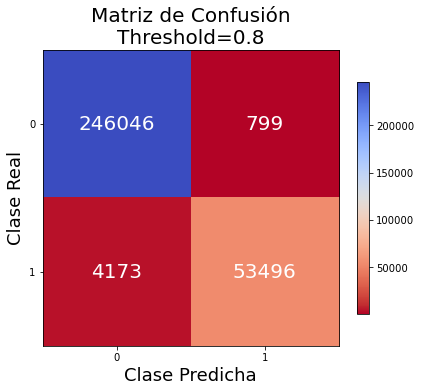

In [ ]:
from tracker.utils import plot_confusion_matrix, plot_precision_recall

plot_confusion_matrix(confidence_scores, ground_truths, threshold=0.8)

Dibujamos también la curva de precision-recall. Esto lo hacemos debido a que ésta se centra más en las clases minoritarias cuando los problemas son desbalanceados, como es el caso.

F1 máximo: 0.9557
Umbral óptimo: 0.81040990


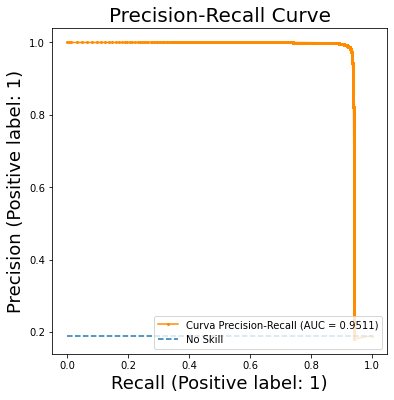

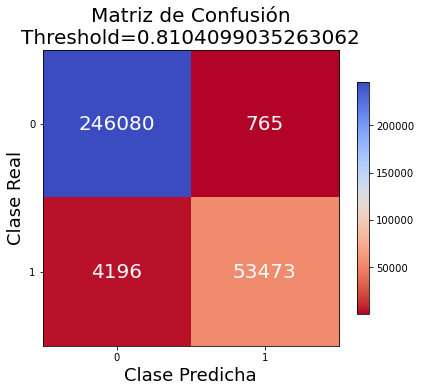

0.8104099035263062

In [ ]:
plot_precision_recall(confidence_scores, ground_truths)

Así, hemos mejorado la puntuación F1-score hasta un valor de $95.57$ $\%$. Por último, comprobamos que el F1 óptimo coincida con el F1 estableciendo este umbral manualmente en la clase `FRCNN_FPN`.

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# object detector
obj_detect = FRCNN_FPN(num_classes=num_classes, box_nms_thresh=0.5, box_score_thresh=0.81040990)
# # Default values:
# box_nms_thresh=0.5
# box_score_thresh=0.05
obj_detect_state_dict = torch.load(obj_detect_model_file,map_location=lambda storage, loc: storage)
obj_detect.load_state_dict(obj_detect_state_dict)
obj_detect.eval()     # set to evaluation mode
obj_detect.to(device) # load detector to GPU or CPU

# select dataset
seq_name = 'MOT16-test' #'MOT16-train', 'MOT16-02'
data_dir = os.path.join(working_dir, 'data/MOT16')
sequences = MOT16Sequences(seq_name, data_dir)
print('Loaded {:d} sequences for {:s}'.format(len(sequences),seq_name))

#output directory
output_dir = os.path.join(working_dir, 'output')

/home/fernando/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:135: UserWarning: Using 'backbone_name' and 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/home/fernando/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Loaded 3 sequences for MOT16-test


In [ ]:
%%time

from tracker.data_obj_detect import MOT16ObjDetect
from tracker.utils import (evaluate_obj_detect, obj_detect_transforms)

#load train set for the MOT16 data (images and ground-truth bounding boxes)
dataset_test = MOT16ObjDetect(os.path.join(working_dir, 'data/MOT16/train'), obj_detect_transforms(train=False))

def collate_fn(batch):
    return tuple(zip(*batch))
data_loader_test = torch.utils.data.DataLoader(dataset_test, batch_size=1, shuffle=False, num_workers=2,collate_fn=collate_fn)

#evaluation
evaluate_obj_detect(obj_detect, data_loader_test)

100%|███████████████████████████████████████████████████████████████████████████████| 3012/3012 [04:02<00:00, 12.42it/s]


AP: 91.4213 %.  Prec: 98.5895 %.  Rec: 92.7223 %.  TP: 53472.  FP: 765.  F1-score: 95.5659 %.
CPU times: user 4min 54s, sys: 17.4 s, total: 5min 12s
Wall time: 5min 14s


In [ ]:
# AQUÍ ESTÁ LA FUNCIÓN 'print_eval':
type(dataset_test)

tracker.data_obj_detect.MOT16ObjDetect

Una futura mejora a hacer consistiría en seleccionar también el umbral de la supresión de no-máximos (*non-maximum supression* en inglés). La supresión de no-máximos consiste en suprimir la detección de menor confianza cuando dos de estas coinciden.

### A continuación, comprobamos el impacto sobre el seguidor de objetos final:

In [ ]:
# create a new tracker using the 'TrackerIoUAssignment' class
tracker = TrackerIoUAssignment(obj_detect)
print('Tracker created!')

time_total = 0
mot_accums = []
results_seq = {}

for seq in sequences:
    print(f"Tracking: {seq}")
    now = time.time()

    # restart tracker state for each sequence
    tracker.reset()

    #load data
    data_loader = torch.utils.data.DataLoader(seq, batch_size=1, shuffle=False)

    #run tracker
    for frame in tqdm(data_loader):
        tracker.step(frame)

    #keep results
    results = tracker.get_results()
    results_seq[str(seq)] = results

    #perform evaluation
    if seq.no_gt:
        print(f"No GT evaluation data available.")
    else:
        mot_accums.append(get_mot_accum(results, seq)) #compute and store eval metrics

    time_total += time.time() - now

    print(f"Tracks found: {len(results)}")
    print(f"Runtime for {seq}: {time.time() - now:.1f} s.")

    #save results to output directory
    seq.write_results(results, os.path.join(output_dir))

Tracker created!
Tracking: MOT16-13


100%|█████████████████████████████████████████████████████████████████████████████████| 750/750 [01:11<00:00, 10.43it/s]


Tracks found: 98
Runtime for MOT16-13: 82.4 s.
Writing predictions to: work/output/MOT16-13.txt
Tracking: MOT16-11


100%|█████████████████████████████████████████████████████████████████████████████████| 900/900 [01:26<00:00, 10.38it/s]


Tracks found: 60
Runtime for MOT16-11: 98.9 s.
Writing predictions to: work/output/MOT16-11.txt
Tracking: MOT16-10


100%|█████████████████████████████████████████████████████████████████████████████████| 654/654 [01:03<00:00, 10.31it/s]


Tracks found: 71
Runtime for MOT16-10: 73.1 s.
Writing predictions to: work/output/MOT16-10.txt


In [ ]:
print(f"Runtime for all sequences: {time_total:.1f} s.")
if mot_accums:
    evaluate_mot_accums(mot_accums,
                        [str(s) for s in sequences if not s.no_gt],
                        generate_overall=True)

Runtime for all sequences: 254.4 s.
          IDF1   IDP   IDR  Rcll  Prcn  GT MT PT  ML   FP    FN IDs   FM  MOTA  MOTP
MOT16-13 48.5% 72.4% 36.4% 43.8% 87.0% 110 31 29  50  764  6548  71   76 36.6% 0.127
MOT16-11 52.5% 58.0% 48.0% 55.1% 66.7%  75 15 29  31 2600  4236  19   24 27.4% 0.075
MOT16-10 36.3% 46.5% 29.8% 40.9% 63.8%  57 13 22  22 2976  7590  54   83 17.3% 0.134
OVERALL  45.1% 57.5% 37.1% 45.8% 71.0% 242 59 80 103 6340 18374 144  183 26.7% 0.112


Así, habiendo tuneado el valor del umbral, observamos que en muchas métricas el rendimiento mejora, excepto en algunas.

# 6. Extend the baseline object tracker

Ahora vamos a aplicar el algoritmo húngaro al object tracker.

Para ello, investigamos la función `scipy.optimize.linear_sum_assignment`.

In [ ]:
import scipy
import inspect
from scipy.optimize import linear_sum_assignment

source_code = inspect.getsource(scipy.optimize)
print(source_code)

"""
Optimization and root finding (:mod:`scipy.optimize`)

.. currentmodule:: scipy.optimize

.. toctree::
   :hidden:

   optimize.cython_optimize

SciPy ``optimize`` provides functions for minimizing (or maximizing)
objective functions, possibly subject to constraints. It includes
solvers for nonlinear problems (with support for both local and global
optimization algorithms), linear programming, constrained
and nonlinear least-squares, root finding, and curve fitting.

Common functions and objects, shared across different solvers, are:

.. autosummary::
   :toctree: generated/

   show_options - Show specific options optimization solvers.
   OptimizeResult - The optimization result returned by some optimizers.
   OptimizeWarning - The optimization encountered problems.


Optimization

Scalar functions optimization
-----------------------------

.. autosummary::
   :toctree: generated/

   minimize_scalar - Interface for minimizers of univariate functions

The `minimize_scalar` functi

In [ ]:
help(scipy.optimize.linear_sum_assignment)

Help on built-in function linear_sum_assignment in module scipy.optimize._lsap:

linear_sum_assignment(...)
    Solve the linear sum assignment problem.
    
    Parameters
    ----------
    cost_matrix : array
        The cost matrix of the bipartite graph.
    
    maximize : bool (default: False)
        Calculates a maximum weight matching if true.
    
    Returns
    -------
    row_ind, col_ind : array
        An array of row indices and one of corresponding column indices giving
        the optimal assignment. The cost of the assignment can be computed
        as ``cost_matrix[row_ind, col_ind].sum()``. The row indices will be
        sorted; in the case of a square cost matrix they will be equal to
        ``numpy.arange(cost_matrix.shape[0])``.
    
    See Also
    --------
    scipy.sparse.csgraph.min_weight_full_bipartite_matching : for sparse inputs
    
    Notes
    -----
    
    The linear sum assignment problem [1]_ is also known as minimum weight
    matching in bi

En la documentación de la función `scipy.optimize.linear_sum_assignment`, pone que "the goal is to find a complete assignment of workers to jobs of minimal cost", es decir, que si la matriz de coste es, por ejemplo, $3\times 4$, asigna una detección antigua a cada detección nueva (recordar que las nuevas detecciones van en las filas). Por este motivo, debemos utilizar esta función extendiendo la función de coste para tener en cuenta tanto las missing detections como las false detections.

In [ ]:
import numpy as np
from scipy.optimize import linear_sum_assignment

# Crear una matriz de costos (por ejemplo)
cost_matrix = np.array([[0.45, 0.25, 1, 1], [1, 1.0, 0.15, 1], [1, 1, 1, 0.1]])
print(cost_matrix)
print()

# Resolver el problema de asignación lineal
row_ind, col_ind = linear_sum_assignment(cost_matrix)

# Mostrar la asignación óptima
print("Asignación óptima:")
for worker, task in zip(row_ind, col_ind):
    print(f"Trabajador {worker} -> Tarea {task}")

[[0.45 0.25 1.   1.  ]
 [1.   1.   0.15 1.  ]
 [1.   1.   1.   0.1 ]]

Asignación óptima:
Trabajador 0 -> Tarea 1
Trabajador 1 -> Tarea 2
Trabajador 2 -> Tarea 3


Creamos las matrices de false detections y missing detections:

In [ ]:
# Crear matriz de unos
missing_detections_matrix = np.ones((cost_matrix.shape[1], cost_matrix.shape[1]))

# Llenar la diagonal principal con 0.4
np.fill_diagonal(missing_detections_matrix, 0.4)

print(missing_detections_matrix)

# Crear matriz de unos
false_detections_matrix = np.ones((cost_matrix.shape[0], cost_matrix.shape[0]))

# Llenar la diagonal principal con 0.8
np.fill_diagonal(false_detections_matrix, 0.9)

print(false_detections_matrix)

[[0.4 1.  1.  1. ]
 [1.  0.4 1.  1. ]
 [1.  1.  0.4 1. ]
 [1.  1.  1.  0.4]]
[[0.9 1.  1. ]
 [1.  0.9 1. ]
 [1.  1.  0.9]]


Concatenamos estas dos matrices de false y missing detections:

In [ ]:
extended_cost = np.concatenate((np.concatenate((cost_matrix, false_detections_matrix), axis=1), np.concatenate((missing_detections_matrix, np.ones((cost_matrix.shape[1], cost_matrix.shape[0]))), axis=1)), axis=0)
print(extended_cost)

[[0.45 0.25 1.   1.   0.9  1.   1.  ]
 [1.   1.   0.15 1.   1.   0.9  1.  ]
 [1.   1.   1.   0.1  1.   1.   0.9 ]
 [0.4  1.   1.   1.   1.   1.   1.  ]
 [1.   0.4  1.   1.   1.   1.   1.  ]
 [1.   1.   0.4  1.   1.   1.   1.  ]
 [1.   1.   1.   0.4  1.   1.   1.  ]]


In [ ]:
# Resolver el problema de asignación lineal
row_ind, col_ind = linear_sum_assignment(extended_cost)

# Mostrar la asignación óptima
print("Asignación óptima:")
for worker, task in zip(row_ind, col_ind):
    print(f"Trabajador {worker} -> Tarea {task}")

Asignación óptima:
Trabajador 0 -> Tarea 1
Trabajador 1 -> Tarea 2
Trabajador 2 -> Tarea 3
Trabajador 3 -> Tarea 0
Trabajador 4 -> Tarea 4
Trabajador 5 -> Tarea 5
Trabajador 6 -> Tarea 6


In [ ]:
asignation_matrix = np.zeros((extended_cost.shape[0], extended_cost.shape[1]))
for i in range(extended_cost.shape[0]):
    for j in range(extended_cost.shape[1]):
        if (i,j) in zip(row_ind, col_ind):
            asignation_matrix[i,j] = 1.0
print(asignation_matrix)

[[0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 1.]]


In [ ]:
def extend_cost_matrix(cost_matrix):

    # Crear matriz de unos
    missing_detections_matrix = np.ones((cost_matrix.shape[1], cost_matrix.shape[1]))

    # Llenar la diagonal principal con 0.4
    np.fill_diagonal(missing_detections_matrix, 0.4)

    # Crear matriz de unos
    false_detections_matrix = np.ones((cost_matrix.shape[0], cost_matrix.shape[0]))

    # Llenar la diagonal principal con 0.8
    np.fill_diagonal(false_detections_matrix, 0.8)

    extended_cost = np.concatenate((np.concatenate((cost_matrix, false_detections_matrix), axis=1),
            np.concatenate((missing_detections_matrix, np.ones((cost_matrix.shape[1],
             cost_matrix.shape[0]))), axis=1)), axis=0)

    return extended_cost

extended_cost = extend_cost_matrix(cost_matrix)
print(extended_cost)

[[0.45 0.25 1.   1.   0.8  1.   1.  ]
 [1.   1.   0.15 1.   1.   0.8  1.  ]
 [1.   1.   1.   0.1  1.   1.   0.8 ]
 [0.4  1.   1.   1.   1.   1.   1.  ]
 [1.   0.4  1.   1.   1.   1.   1.  ]
 [1.   1.   0.4  1.   1.   1.   1.  ]
 [1.   1.   1.   0.4  1.   1.   1.  ]]


### A continuación, lo juntamos todo en la implementación del tracker:

In [ ]:
import numpy as np
import motmetrics as mm
mm.lap.default_solver = 'lap'
from tracker.tracker import Tracker, Track
from scipy.optimize import linear_sum_assignment

# extended class 'Tracker' based on IoU criterion
class TrackerIoUAssignment_hungarian(Tracker):

    def extend_cost_matrix(self, cost_matrix, mis_det_thres=0.4, false_det_thres=0.8):
        # Función que extiende la matriz de coste con unos umbrales dados
        # mis_det_thres=0.4: missing detection main diagonal threshold
        # false_det_thres=0.8: false detection main diagonal threshold
        # Crear matriz de unos
        missing_detections_matrix = np.ones((cost_matrix.shape[1], cost_matrix.shape[1]))

        # Llenar la diagonal principal con 0.4
        np.fill_diagonal(missing_detections_matrix, mis_det_thres)

        # Crear matriz de unos
        false_detections_matrix = np.ones((cost_matrix.shape[0], cost_matrix.shape[0]))

        # Llenar la diagonal principal con 0.8
        np.fill_diagonal(false_detections_matrix, false_det_thres)

        extended_cost = np.concatenate((np.concatenate((cost_matrix, false_detections_matrix), axis=1),
                np.concatenate((missing_detections_matrix, np.ones((cost_matrix.shape[1],
                 cost_matrix.shape[0]))), axis=1)), axis=0)

        return extended_cost

    def data_association(self, boxes_new, scores_new):
        if self.tracks:
#             print(self.track_num)
            # Aquí hacemos el procesado de todos los tracks (detecciones) en el último frame
            # definido por (boxes_new, scores_new) y por los tracks del anterior frame (gardado en self.tracks)

            ids_previous = [t.id for t in self.tracks]
            boxes_previous = np.stack([t.box.numpy() for t in self.tracks], axis=0)


            # compute distance based on IoU (distance=1-IoU)
            # This is the cost matrix
            distance = mm.distances.iou_matrix(objs=boxes_previous, hyps=boxes_new.numpy(), max_iou=0.5).T
#             print(f"previous detections: {len(boxes_previous)}, new detections: {len(boxes_new)}")
#             print(f"cost matrix shape: {distance.shape}")
            distance[np.isnan(distance)] = 1.0

            row_number, col_number = distance.shape
#             print(row_number==len(boxes_new))
#             print(col_number==len(self.tracks))

            # ALGORITMO HÚNGARO
            # Para implementar el algoritmo húngaro, debemos calcular la matriz de coste extendida
            extended_cost_matrix = self.extend_cost_matrix(distance,mis_det_thres=0.95,false_det_thres=0.9)


            # Solve data association using linear_sum_assignment
            row_indices, col_indices = linear_sum_assignment(extended_cost_matrix, maximize=False)

            # update existing tracks
            # Remove unmatched and assign the trackers with their objects
            track_ids_to_remove = []
            new_boxes = []
            new_scores = []
            for i,j in zip(row_indices, col_indices):
                # Para cada fila y columna con un 1 de la matriz de asignación extendida
                # # y que sea una detección actual o anterior
                if i<row_number and j<col_number:
#                     print("i:", i, row_number)
#                     print("j:", j, col_number)
                    # Aquí el objeto ha cambiado su posición, así que debemos actualizarla:
                    self.tracks[j].box = boxes_new[i]
                    self.tracks[j].score = scores_new[i]
                elif i<row_number and j>=col_number:
                    # Se trata de una false detection para el frame k.
                    # Aquí puede tratarse de un objeto mal detectado o de una nueva persona en la imagen
                    # Vamos a considerar que siempre se trata de una nueva persona,
                    # # por lo que creamos un nuevo track con un nuevo id
                    new_boxes.append(boxes_new[i])
                    new_scores.append(scores_new[i])
#                     self.tracks.append(Track(boxes_new[i],scores_new[i],self.track_num+1))
#                     self.track_num += 1
                elif i>=row_number and j<col_number:
                    # Se trata de una missing detection, el objeto puede haber desaparecido de la imagen
                    track_ids_to_remove.append(self.tracks[j].id)
#                     track_to_remove = [t for t in self.tracks if t.id==ids_previous[j]][0]
#                     self.tracks.remove(track_to_remove)

            # Efectuar las operaciones de eliminar y añadir tracks:
            self.tracks = [t for t in self.tracks
                    if t.id not in track_ids_to_remove]
            self.add(new_boxes, new_scores)


        else:
            # Este es el procesamiento de los frames cuando no hay detecciones,
            # como por ejemplo, en el primer frame, o si han desaparecido todos los objetos del vídeo
            self.add(boxes_new, scores_new)

# create a new tracker using the 'TrackerIoUAssignment' class
tracker = TrackerIoUAssignment_hungarian(obj_detect)
print('Tracker created!')

Tracker created!


### Cargamos primero las secuencias de train:

In [ ]:
# select dataset
seq_name = 'MOT16-train' #'MOT16-train', 'MOT16-02'
data_dir = os.path.join(working_dir, 'data/MOT16')
sequences_train = MOT16Sequences(seq_name, data_dir)
print('Loaded {:d} sequences for {:s}'.format(len(sequences_train),seq_name))

#output directory
output_dir = os.path.join(working_dir, 'output')

Loaded 4 sequences for MOT16-train


In [ ]:
import time
from tqdm import tqdm
from tracker.utils import get_mot_accum

time_total = 0
mot_accums = []
results_seq_train = {}

for seq in sequences_train:
    print(f"Tracking: {seq}")
    now = time.time()

    # restart tracker state for each sequence
    tracker.reset()

    # load data
    data_loader = torch.utils.data.DataLoader(seq, batch_size=1, shuffle=False)

    # run tracker
    for frame in tqdm(data_loader):
        tracker.step(frame)

    # keep results
    results = tracker.get_results()
    results_seq_train[str(seq)] = results

    # perform evaluation
    if seq.no_gt:
        print(f"No GT evaluation data available.")
    else:
        mot_accums.append(get_mot_accum(results, seq)) #compute and store eval metrics

    time_total += time.time() - now

    print(f"Tracks found: {len(results)}")
    print(f"Runtime for {seq}: {time.time() - now:.1f} s.")

    # save results to output directory
    seq.write_results(results, os.path.join(output_dir))

Tracking: MOT16-05


100%|█████████████████████████████████████████████████████████████████████████████████| 837/837 [01:02<00:00, 13.46it/s]


Tracks found: 219
Runtime for MOT16-05: 64.6 s.
Writing predictions to: work/output/MOT16-05.txt
Tracking: MOT16-02


100%|█████████████████████████████████████████████████████████████████████████████████| 600/600 [00:57<00:00, 10.35it/s]


Tracks found: 187
Runtime for MOT16-02: 69.1 s.
Writing predictions to: work/output/MOT16-02.txt
Tracking: MOT16-09


100%|█████████████████████████████████████████████████████████████████████████████████| 525/525 [00:50<00:00, 10.30it/s]


Tracks found: 73
Runtime for MOT16-09: 58.7 s.
Writing predictions to: work/output/MOT16-09.txt
Tracking: MOT16-04


100%|███████████████████████████████████████████████████████████████████████████████| 1050/1050 [01:47<00:00,  9.75it/s]


Tracks found: 219
Runtime for MOT16-04: 140.1 s.
Writing predictions to: work/output/MOT16-04.txt


In [ ]:
from tracker.utils import evaluate_mot_accums

print(f"Runtime for all sequences: {time_total:.1f} s.")
if mot_accums:
    evaluate_mot_accums(mot_accums,
                        [str(s) for s in sequences_train if not s.no_gt],
                        generate_overall=True)

Runtime for all sequences: 332.5 s.
          IDF1   IDP   IDR  Rcll  Prcn  GT  MT  PT ML  FP    FN IDs   FM  MOTA  MOTP
MOT16-05 60.4% 75.2% 50.5% 66.3% 98.8% 133  45  73 15  56  2330 137  108 63.5% 0.134
MOT16-02 43.8% 65.0% 33.0% 50.4% 99.2%  62  12  36 14  73  9220 143  133 49.2% 0.079
MOT16-09 52.5% 64.6% 44.2% 67.8% 99.1%  26  13  12  1  31  1713  56   54 66.2% 0.085
MOT16-04 71.0% 81.7% 62.8% 76.6% 99.8%  83  44  24 15  76 11116 144  144 76.2% 0.096
OVERALL  63.1% 77.1% 53.4% 68.9% 99.6% 304 114 145 45 236 24379 480  439 68.0% 0.095


### Por último, cargamos y predecimos las secuencias de test:

In [ ]:
# select dataset
seq_name = 'MOT16-test' #'MOT16-train', 'MOT16-02'
data_dir = os.path.join(working_dir, 'data/MOT16')
sequences_test = MOT16Sequences(seq_name, data_dir)
print('Loaded {:d} sequences for {:s}'.format(len(sequences_test),seq_name))

#output directory
output_dir = os.path.join(working_dir, 'output')

Loaded 3 sequences for MOT16-test


In [ ]:
import time
from tqdm import tqdm
from tracker.utils import get_mot_accum

time_total = 0
mot_accums = []
results_seq_test = {}

for seq in sequences_test:
    print(f"Tracking: {seq}")
    now = time.time()

    # restart tracker state for each sequence
    tracker.reset()

    # load data
    data_loader = torch.utils.data.DataLoader(seq, batch_size=1, shuffle=False)

    # run tracker
    for frame in tqdm(data_loader):
        tracker.step(frame)

    # keep results
    results = tracker.get_results()
    results_seq_test[str(seq)] = results

    # perform evaluation
    if seq.no_gt:
        print(f"No GT evaluation data available.")
    else:
        mot_accums.append(get_mot_accum(results, seq)) #compute and store eval metrics

    time_total += time.time() - now

    print(f"Tracks found: {len(results)}")
    print(f"Runtime for {seq}: {time.time() - now:.1f} s.")

    # save results to output directory
    seq.write_results(results, os.path.join(output_dir))

Tracking: MOT16-13


100%|█████████████████████████████████████████████████████████████████████████████████| 750/750 [01:12<00:00, 10.40it/s]


Tracks found: 310
Runtime for MOT16-13: 83.2 s.
Writing predictions to: work/output/MOT16-13.txt
Tracking: MOT16-11


100%|█████████████████████████████████████████████████████████████████████████████████| 900/900 [01:25<00:00, 10.56it/s]


Tracks found: 121
Runtime for MOT16-11: 97.8 s.
Writing predictions to: work/output/MOT16-11.txt
Tracking: MOT16-10


100%|█████████████████████████████████████████████████████████████████████████████████| 654/654 [01:03<00:00, 10.36it/s]


Tracks found: 263
Runtime for MOT16-10: 72.7 s.
Writing predictions to: work/output/MOT16-10.txt


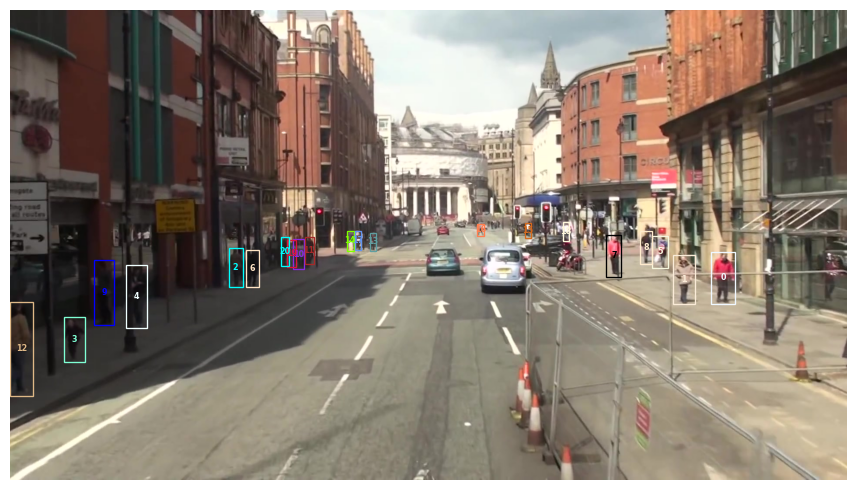

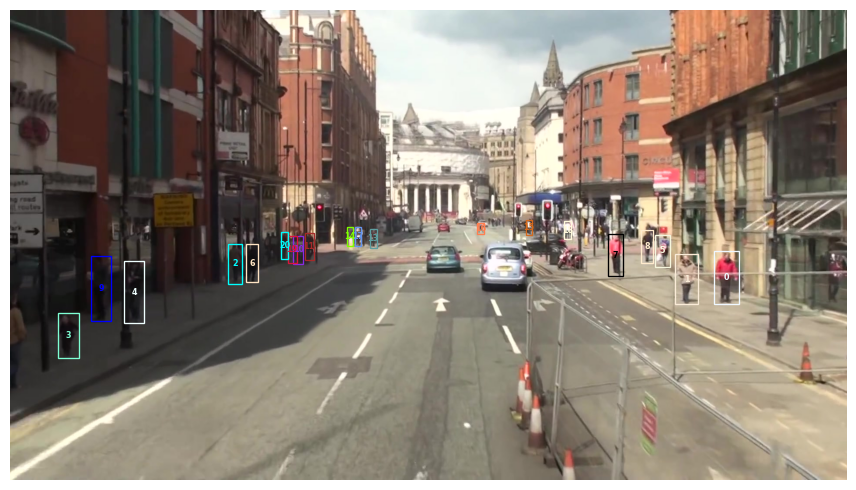

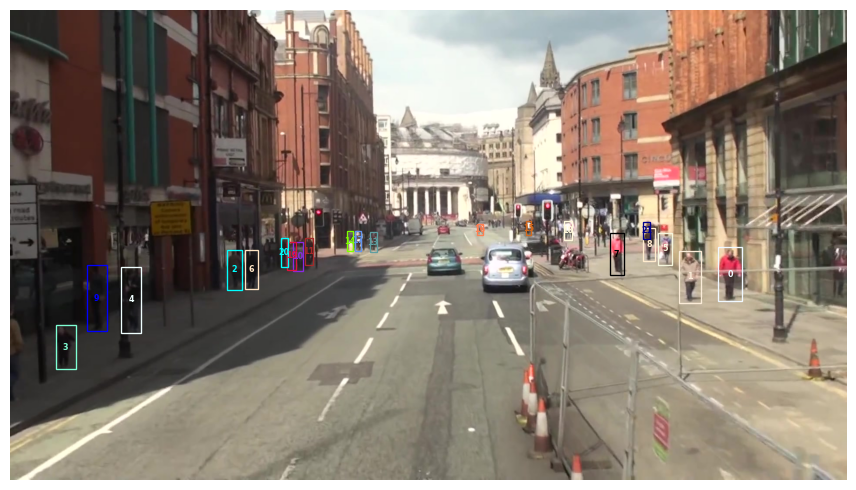

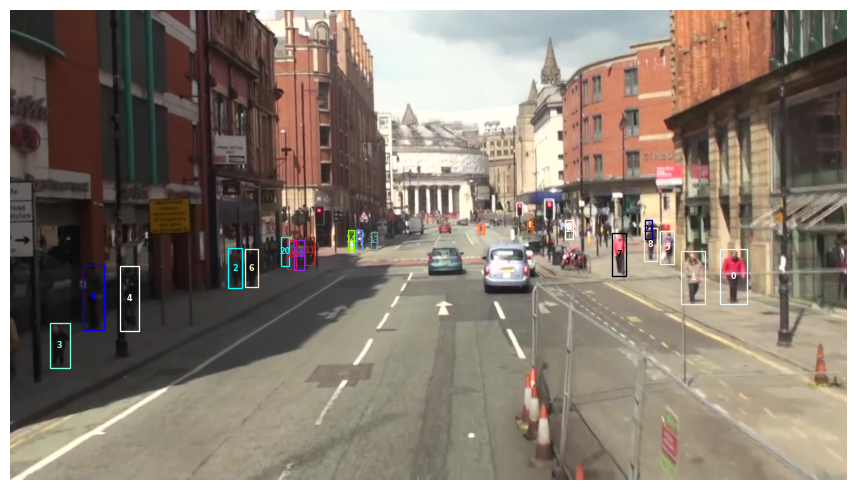

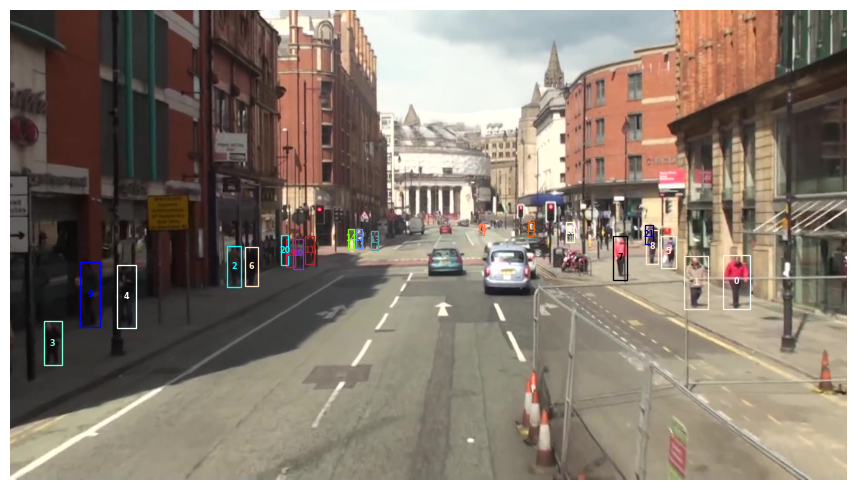

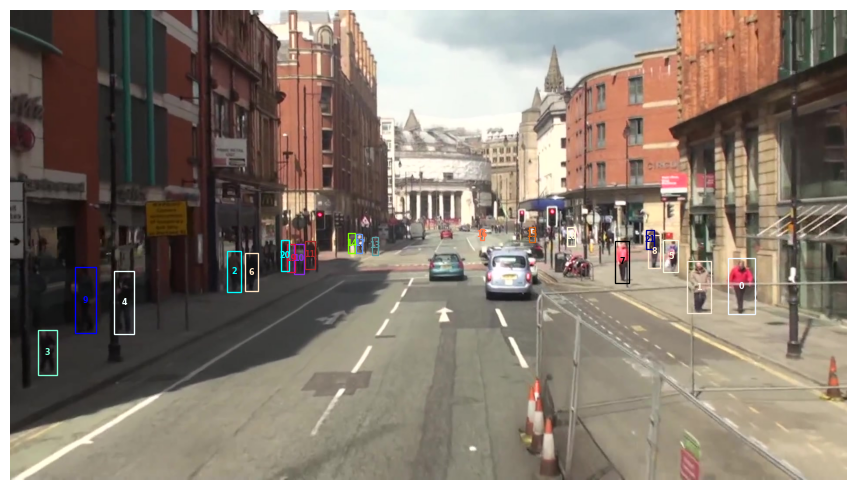

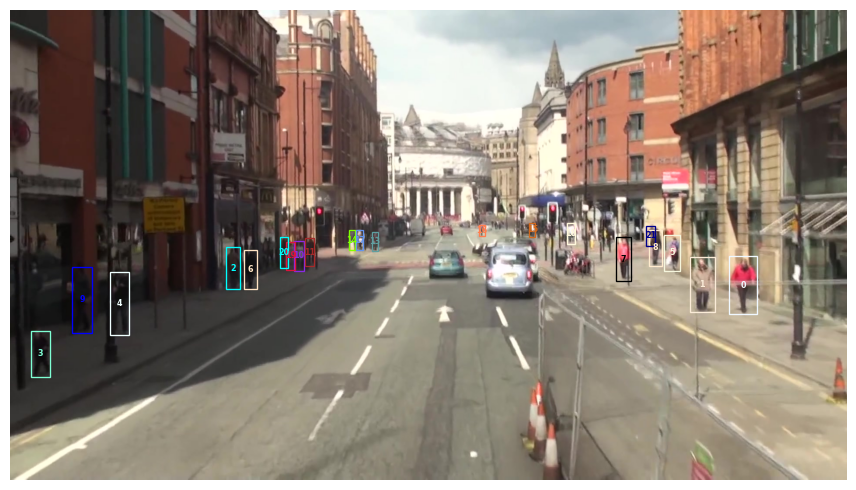

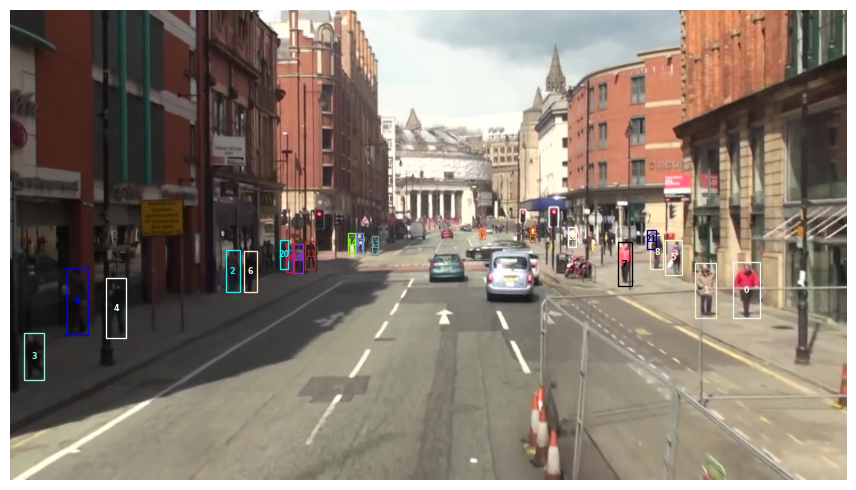

In [ ]:
import matplotlib.pyplot as plt
from tracker.utils import plot_sequence

plot_sequence(results_seq_test['MOT16-13'],
              [s for s in sequences_test if str(s) == 'MOT16-13'][0],
              first_n_frames=7)

### Finalmente, exportamos estas secuencias de test etiquetadas en formato `.mp4`.

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import itertools
from tqdm import tqdm
import os

def export_to_mp4(tracks, db, output_path):
    """Plots a whole sequence and saves it as a video.

    Args:
        tracks (dict): The dictionary containing the track dictionaries in the form tracks[track_id][frame] = bb
        db (torch.utils.data.Dataset): The dataset with the images belonging to the tracks (e.g. MOT_Sequence object)
        output_path (str): The path to save the output video.
    """

    # Infinite color loop
    colors = plt.cm.get_cmap('tab20', 20)  # Get a colormap with 20 different colors
    cyl = itertools.cycle(range(20))  # Cycle through 20 different colors
    styles = defaultdict(lambda: {'ec': colors(next(cyl)), 'fc': 'none'})

    # Get video properties from the first image
    first_img = db[0]['img'].mul(255).permute(1, 2, 0).byte().numpy()
    height, width, _ = first_img.shape
    fps = 30  # Frames per second for the video

    # Initialize video writer
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    video_writer = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    # Process each frame and add to the video
    for i, v in enumerate(tqdm(db, desc="Processing frames")):
        img = v['img'].mul(255).permute(1, 2, 0).byte().numpy()
        fig, ax = plt.subplots(1, dpi=96, figsize=(width / 96, height / 96))
        ax.set_axis_off()
        ax.imshow(img)

        for j, t in tracks.items():
            if i in t:
                t_i = t[i]
                rect = plt.Rectangle(
                    (t_i[0], t_i[1]),
                    t_i[2] - t_i[0],
                    t_i[3] - t_i[1],
                    fill=False,
                    linewidth=2.0,  # Increased linewidth
                    edgecolor=styles[j]['ec']
                )
                ax.add_patch(rect)

                # Calculate font size relative to rectangle height
                rect_height = t_i[3] - t_i[1]
                font_size = max(6, rect_height / 10)

                ax.annotate(
                    j,
                    (t_i[0] + (t_i[2] - t_i[0]) / 2.0, t_i[1] + (t_i[3] - t_i[1]) / 2.0),
                    color=styles[j]['ec'],
                    weight='bold',
                    fontsize=font_size,
                    ha='center',
                    va='center'
                )

        # Remove any margins around the plot
        fig.subplots_adjust(left=0, right=1, top=1, bottom=0)

        # Save the current frame as an image
        fig.canvas.draw()
        frame = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
        frame = frame.reshape(fig.canvas.get_width_height()[::-1] + (3,))

        # Close the plot to free memory
        plt.close(fig)

        # Convert RGB to BGR for OpenCV
        frame_bgr = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
        video_writer.write(frame_bgr)

    # Release the video writer
    video_writer.release()
    print(f'Video saved to {output_path}')


#### Exportamos las secuencias de train:

In [ ]:
export_to_mp4(results_seq_train['MOT16-02'],
              [s for s in sequences_train if str(s) == 'MOT16-02'][0], output_path=working_dir+'output/MOT16-02.mp4')

Processing frames: 100%|██████████████████████████████████████████████████████████████| 600/600 [01:06<00:00,  9.05it/s]

Video saved to work/output/MOT16-02.mp4


In [ ]:
export_to_mp4(results_seq_train['MOT16-04'],
              [s for s in sequences_train if str(s) == 'MOT16-04'][0], output_path=working_dir+'output/MOT16-04.mp4')

Processing frames: 100%|████████████████████████████████████████████████████████████| 1050/1050 [02:30<00:00,  6.98it/s]

Video saved to work/output/MOT16-04.mp4


In [ ]:
export_to_mp4(results_seq_train['MOT16-05'],
              [s for s in sequences_train if str(s) == 'MOT16-05'][0], output_path=working_dir+'output/MOT16-05.mp4')

Processing frames: 100%|██████████████████████████████████████████████████████████████| 837/837 [00:33<00:00, 24.98it/s]

Video saved to work/output/MOT16-05.mp4


In [ ]:
export_to_mp4(results_seq_train['MOT16-09'],
              [s for s in sequences_train if str(s) == 'MOT16-09'][0], output_path=working_dir+'output/MOT16-09.mp4')

Processing frames: 100%|██████████████████████████████████████████████████████████████| 525/525 [00:53<00:00,  9.89it/s]

Video saved to work/output/MOT16-09.mp4


#### Exportamos las secuencias de test:

In [ ]:
export_to_mp4(results_seq_test['MOT16-13'],
              [s for s in sequences_test if str(s) == 'MOT16-13'][0], output_path=working_dir+'output/MOT16-13.mp4')

Processing frames: 100%|██████████████████████████████████████████████████████████████| 750/750 [01:24<00:00,  8.85it/s]

Video saved to work/output/MOT16-13.mp4


In [ ]:
export_to_mp4(results_seq_test['MOT16-11'],
              [s for s in sequences_test if str(s) == 'MOT16-11'][0], output_path=working_dir+'output/MOT16-11.mp4')

Processing frames: 100%|██████████████████████████████████████████████████████████████| 900/900 [01:33<00:00,  9.59it/s]

Video saved to work/output/MOT16-11.mp4


In [ ]:
export_to_mp4(results_seq_test['MOT16-10'],
              [s for s in sequences_test if str(s) == 'MOT16-10'][0], output_path=working_dir+'output/MOT16-10.mp4')

Processing frames: 100%|██████████████████████████████████████████████████████████████| 654/654 [01:12<00:00,  8.99it/s]

Video saved to work/output/MOT16-10.mp4
